In [61]:
import os
import matplotlib.pyplot as plt
import numpy as np
from collections import defaultdict
from pathlib import Path
from typing import Tuple
from PIL import Image
import pandas as pd
import boto3
from botocore.client import Config
import random

In [68]:
project_root    = Path().resolve().parent   # adjust if needed
datasets_path   = project_root / "data" / "raw_data"
dataset1_path   = Path(datasets_path) / "dataset1"
dataset2_path   = Path(datasets_path) / "dataset2"
dataset3_path   = Path(datasets_path) / "dataset3"
dataset4_path   = Path(datasets_path) / "dataset4"
dataset5_path   = Path(datasets_path) / "dataset5" / "additional_images"

In [63]:
# Countries of interest
COUNTRIES = ["Albania","Andorra","Argentina","Australia","Austria","Bangladesh","Belgium","Bhutan","Bolivia","Botswana","Brazil","Bulgaria","Cambodia","Canada","Chile","Colombia","Croatia","Czechia","Denmark","Dominican Republic","Ecuador","Estonia","Eswatini","Finland","France","Germany","Ghana","Greece","Greenland","Guatemala","Hungary","Iceland","Indonesia","Ireland","Israel","Italy","Japan","Jordan","Kenya","Kyrgyzstan","Latvia","Lesotho","Lithuania","Luxembourg","Malaysia","Mexico","Mongolia","Montenegro","Netherlands","New Zealand","Nigeria","North Macedonia","North Mariana Islands","Norway","Palestine","Panama","Peru","Philippines","Poland","Portugal","Romania","Russia","Senegal","Serbia","Singapore","Slovakia","Slovenia","South Africa","South Korea","Spain","Sri Lanka","Sweden","Switzerland","Taiwan","Thailand","Turkey","Ukraine","United Arab Emirates","United Kingdom","United States","Uruguay"]
len(COUNTRIES)

81

# 1. Small dataset (100 images - 79 countries)

## Analyze distribution

In [65]:
def count_images_per_country(base_path, country_list):
    counts = defaultdict(int)
    for country in country_list:
        folder = base_path / country
        if folder.exists() and folder.is_dir():
            counts[country] = len([f for f in os.listdir(folder) if f.lower().endswith(('.jpg', '.jpeg', '.png'))])
    return counts

In [69]:
# Count images
counts1 = count_images_per_country(dataset1_path, COUNTRIES)
counts2 = count_images_per_country(dataset2_path, COUNTRIES)
counts3 = count_images_per_country(dataset3_path, COUNTRIES)
counts4 = count_images_per_country(dataset4_path, COUNTRIES)
counts5 = count_images_per_country(dataset5_path, COUNTRIES)

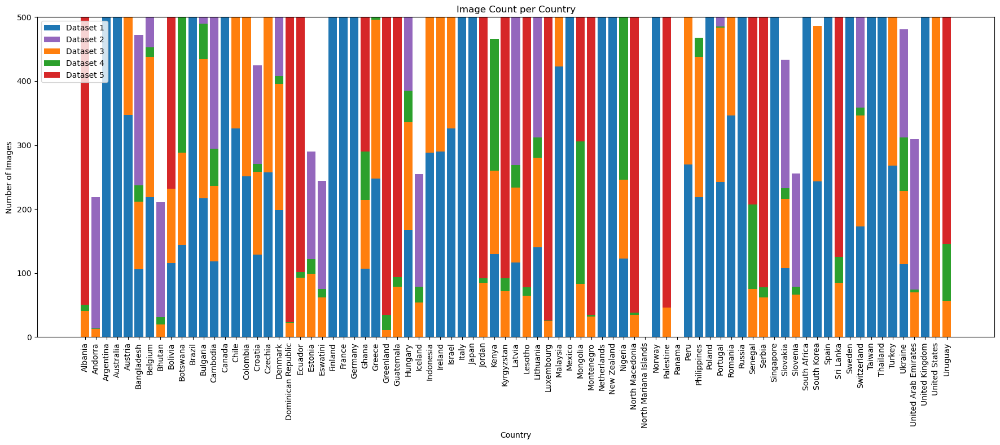

In [71]:
# Plot
labels = COUNTRIES
ds1_vals = np.array([counts1.get(c, 0) for c in labels])
ds2_vals = np.array([counts2.get(c, 0) for c in labels]) 
ds3_vals = np.array([counts3.get(c, 0) for c in labels])
ds4_vals = np.array([counts4.get(c, 0) for c in labels])
ds5_vals = np.array([counts5.get(c, 0) for c in labels])

x = np.arange(len(labels))

plt.figure(figsize=(18, 8))
plt.bar(x, ds1_vals, label='Dataset 1', color='#1f77b4')
plt.bar(x, ds2_vals, bottom=ds1_vals + ds3_vals + ds4_vals + ds5_vals, label='Dataset 2', color='#9467bd')
plt.bar(x, ds3_vals, bottom=ds1_vals, label='Dataset 3', color='#ff7f0e')
plt.bar(x, ds4_vals, bottom=ds1_vals + ds3_vals, label='Dataset 4', color='#2ca02c')
plt.bar(x, ds5_vals, bottom=ds1_vals + ds3_vals + ds4_vals, label='Dataset 5', color='#d62728')

plt.xticks(x, labels, rotation=90)
plt.xlabel('Country')
plt.ylabel('Number of Images')
plt.title('Image Count per Country')
plt.legend()
plt.tight_layout()
plt.ylim(0, 500)
plt.show()

We remove countries were we did not manage to obtain all images: North Mariana Islands, Panama.

In [6]:
# filter COUNTRIES to remove these countries (North Mariana Islands, Panama)
COUNTRIES = [country for country in COUNTRIES if country not in ["North Mariana Islands", "Panama"]]

In [7]:
len(COUNTRIES)

79

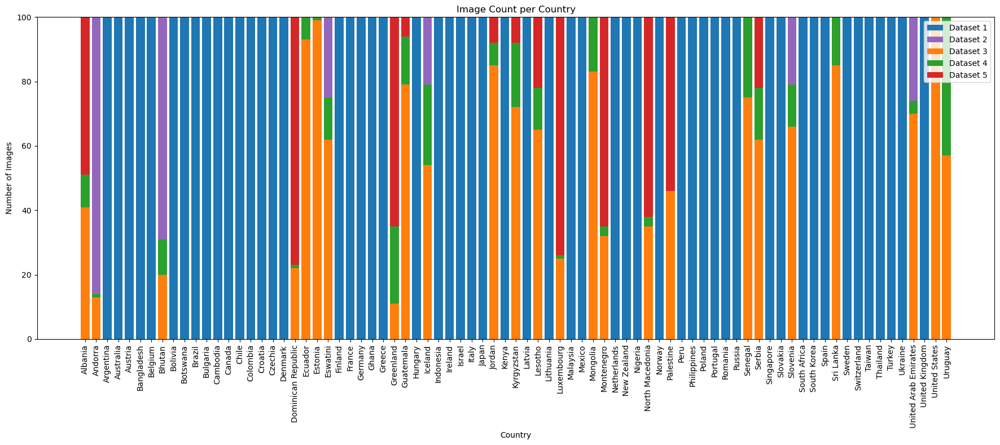

In [169]:
# Plot
labels = COUNTRIES
ds1_vals = np.array([counts1.get(c, 0) for c in labels])
ds2_vals = np.array([counts2.get(c, 0) for c in labels]) * 3
ds3_vals = np.array([counts3.get(c, 0) for c in labels])
ds4_vals = np.array([counts4.get(c, 0) for c in labels])
ds5_vals = np.array([counts5.get(c, 0) for c in labels])

x = np.arange(len(labels))

plt.figure(figsize=(18, 8))
plt.bar(x, ds1_vals, label='Dataset 1', color='#1f77b4')
plt.bar(x, ds2_vals, bottom=ds1_vals + ds3_vals + ds4_vals + ds5_vals, label='Dataset 2', color='#9467bd')
plt.bar(x, ds3_vals, bottom=ds1_vals, label='Dataset 3', color='#ff7f0e')
plt.bar(x, ds4_vals, bottom=ds1_vals + ds3_vals, label='Dataset 4', color='#2ca02c')
plt.bar(x, ds5_vals, bottom=ds1_vals + ds3_vals + ds4_vals, label='Dataset 5', color='#d62728')

plt.xticks(x, labels, rotation=90)
plt.xlabel('Country')
plt.ylabel('Number of Images')
plt.title('Image Count per Country')
plt.legend()
plt.tight_layout()
plt.ylim(0, 100)
plt.show()

## Analyse image sizes

In [ ]:
# 1) Define where your datasets live 
dataset_paths = {
    "Dataset1": datasets_path / "dataset1",
    "Dataset2": datasets_path / "dataset2",
    "Dataset3": datasets_path / "dataset3",
    "Dataset4": datasets_path / "dataset4",
    "Dataset5": project_root / "data_extraction" / "additional_images"
}

# 2) For each dataset, grab the first image found and record its size
records = []
for name, root in dataset_paths.items():
    sample_name, w, h = None, None, None
    if root.exists():
        for path in root.rglob("*"):
            if path.suffix.lower() in (".jpg", ".jpeg", ".png"):
                try:
                    with Image.open(path) as img:
                        w, h = img.size
                    sample_name = path.name
                    break
                except:
                    continue
    records.append({
        "Dataset":     name,
        "Sample File": sample_name,
        "Width":       w,
        "Height":      h
    })

# 3) Build a DataFrame and show it
df = pd.DataFrame(records)

In [140]:
df

,Dataset,Sample File,Width,Height
0,Dataset1,test_03041.jpg,1536,662
1,Dataset2,BT_03530.jpg,3030,561
2,Dataset3,canvas_1629262074.jpg,1536,662
3,Dataset4,9848.png,640,640
4,Dataset5,Luxembourg_417.jpg,640,640


## Create small dataset

In [18]:
def center_crop_to_square(img: Image.Image, target_size) -> Image.Image:
    """Crop the largest possible centered square from img."""
    w, h = img.size
    side = min(w, h)
    left = (w - side) // 2
    top  = (h - side) // 2
    crop = img.crop((left, top, left + side, top + side))
    # 2) resize to fixed square
    return crop.resize((target_size, target_size), Image.BILINEAR)

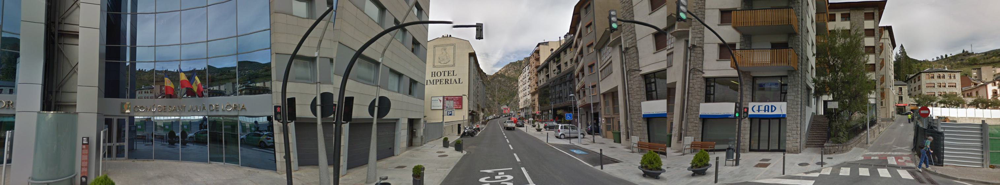

In [73]:
# show one random image in dataset 2
dataset2_path = dataset_paths["Dataset2"]
sample_path = dataset2_path / "Andorra" / "AD_00364.jpg"
sample_path.exists()
sample = Image.open(sample_path)
sample

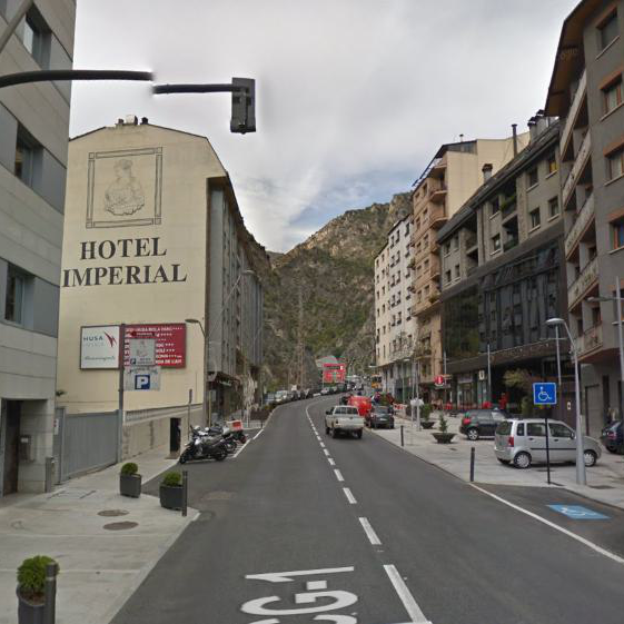

In [76]:
(center_crop_to_square(sample, 624))

In [9]:
project_root      = Path().resolve().parent
small_ds_root     = project_root / "small_dataset"
medium_ds_root    = project_root / "medium_dataset"
datasets_path     = project_root / "datasets"
dataset1_path     = datasets_path / "dataset1"
dataset2_path     = datasets_path / "dataset2"
dataset3_path     = datasets_path / "dataset3"
dataset4_path     = datasets_path / "dataset4"
dataset5_path     = project_root / "data_extraction" / "additional_images"

splits           = ['train', 'dev', 'test']
split_ratios     = {'train': 0.8, 'dev': 0.1, 'test': 0.1}

In [21]:
for split in splits:
    for country in COUNTRIES:
        (small_ds_root / split / country).mkdir(parents=True, exist_ok=True)

In [14]:
def gather_images_for_country(country: str, TARGET_COUNT):
    out = []
    def list_imgs(ds_path):
        folder = ds_path / country
        if not folder.is_dir():
            return []
        return [
            p for p in folder.rglob("*")
            if p.suffix.lower() in (".jpg", ".jpeg", ".png")
        ]

    sources = [
        (dataset1_path, True),
        (dataset3_path, True),
        (dataset5_path, False),
        (dataset2_path, True),
        (dataset4_path, False),
    ]

    # Debug: show counts in each source
    print(f"\n  Country '{country}':")
    for idx, (ds_path, crop_flag) in enumerate(sources, start=1):
        count = len(list_imgs(ds_path))
        print(f"    Source {idx} ({ds_path.name}): {count} images")

    # Build priority list
    for ds_path, crop_flag in sources:
        imgs = list_imgs(ds_path)
        out.extend((p, crop_flag) for p in imgs)

    # Dedupe + trim
    seen = set(); final = []
    for src, crop_flag in out:
        if src in seen: continue
        seen.add(src)
        final.append((src, crop_flag))
        if len(final) >= TARGET_COUNT: break

    print(f"    -> total selected: {len(final)}")
    return final


In [22]:
# ─── MAIN LOOP ───────────────────────────────────────────────────
for country in COUNTRIES:
    print(f"\nProcessing {country}…")

    # 1) Gather 100 qualified images for this country
    picks = gather_images_for_country(country, 100)
    random.shuffle(picks)  # randomize assignment

    # 2) Compute counts
    n_train = int(split_ratios['train'] * 100)
    n_dev   = int(split_ratios['dev']   * 100)
    # ensure full coverage
    n_test  = 100 - n_train - n_dev

    slices = {
        'train': picks[:n_train],
        'dev':   picks[n_train:n_train+n_dev],
        'test':  picks[n_train+n_dev:]
    }

    # 3) Save each split
    for split in splits:
        subset = slices[split]
        out_dir = small_ds_root / split / country
        for idx, (src_path, do_crop) in enumerate(subset, start=1):
            img = Image.open(src_path).convert("RGB")
            if do_crop:
                img = center_crop_to_square(img, 624)  # square crop
            # zero-pad file number within split
            fname = f"{idx:03d}.jpg"
            img.save(out_dir / fname)

        print(f"  → {split.upper():5s}: {len(subset)} images")

print("\nDone! `small_dataset/` now contains train/dev/test splits per country.")


Processing Albania…

  Country 'Albania':
    Source 1 (dataset1): 0 images
    Source 2 (dataset3): 41 images
    Source 3 (additional_images): 503 images
    Source 4 (dataset2): 0 images
    Source 5 (dataset4): 10 images
    -> total selected: 100
  → TRAIN: 80 images
  → DEV  : 10 images
  → TEST : 10 images

Processing Andorra…

  Country 'Andorra':
    Source 1 (dataset1): 0 images
    Source 2 (dataset3): 13 images
    Source 3 (additional_images): 0 images
    Source 4 (dataset2): 205 images
    Source 5 (dataset4): 1 images
    -> total selected: 100
  → TRAIN: 80 images
  → DEV  : 10 images
  → TEST : 10 images

Processing Argentina…

  Country 'Argentina':
    Source 1 (dataset1): 689 images
    Source 2 (dataset3): 689 images
    Source 3 (additional_images): 0 images
    Source 4 (dataset2): 210 images
    Source 5 (dataset4): 905 images
    -> total selected: 100
  → TRAIN: 80 images
  → DEV  : 10 images
  → TEST : 10 images

Processing Australia…

  Country 'Australia'

In [31]:
# check how many folders are in train/dev/test
def count_folders(base_path):
    counts = defaultdict(int)
    for split in splits:
        folder = base_path / split
        if folder.exists() and folder.is_dir():
            counts[split] = len([f for f in os.listdir(folder) if os.path.isdir(os.path.join(folder, f))])
    return counts
# Count folders
counts = count_folders(small_ds_root)
print(counts)
# check how many images are in each folder
def count_images_per_split(base_path):
    counts = defaultdict(int)
    for split in splits:
        folder = base_path / split
        if folder.exists() and folder.is_dir():
            for country in COUNTRIES:
                country_folder = folder / country
                if country_folder.exists() and country_folder.is_dir():
                    counts[split] += len([f for f in os.listdir(country_folder) if f.lower().endswith(('.jpg', '.jpeg', '.png'))])
    return counts
# Count images
counts = count_images_per_split(small_ds_root)
print(counts)


defaultdict(<class 'int'>, {'train': 79, 'dev': 79, 'test': 79})
defaultdict(<class 'int'>, {'train': 6320, 'dev': 790, 'test': 790})


## Upload to wasabi

In [32]:
os.environ["AWS_ACCESS_KEY_ID"] = "VIH97PD2FNFFMYQAESDR"
os.environ["AWS_SECRET_ACCESS_KEY"] = "X2UgOtGwJP5DFYnYjSloe9ilVVb89wseGiRKZa9T"

s3 = boto3.client(
  's3',
  endpoint_url='https://s3.eu-south-1.wasabisys.com',
  config=Config(signature_version='s3v4')
)
s3.list_buckets()  # should show your geoguesser-dataset bucket

{'ResponseMetadata': {'RequestId': '542BA6DDB8DC90FD:A',
  'HostId': 'O7AObN7HT1jlWubPIQTSk5NCBeYdKzXDjFLPjJIS552rLhTHx3W/knk96fSUzQ/iotCyvW47/n2N',
  'HTTPStatusCode': 200,
  'HTTPHeaders': {'content-type': 'application/xml',
   'date': 'Thu, 15 May 2025 10:59:07 GMT',
   'server': 'WasabiS3/7.22.1268-2025-01-15-40c9383ab3',
   'x-amz-id-2': 'O7AObN7HT1jlWubPIQTSk5NCBeYdKzXDjFLPjJIS552rLhTHx3W/knk96fSUzQ/iotCyvW47/n2N',
   'x-amz-request-id': '542BA6DDB8DC90FD:A',
   'x-wasabi-cm-reference-id': '1747306747434 154.56.213.102 ConID:300634683/EngineConID:5763416/Core:61',
   'transfer-encoding': 'chunked'},
  'RetryAttempts': 0},
 'Buckets': [{'Name': 'geoguesser-dataset',
   'CreationDate': datetime.datetime(2025, 5, 11, 12, 18, 16, tzinfo=tzutc())}],
 'Owner': {'DisplayName': 'nardimichelangelo',
  'ID': 'D330802473172BA28BCAD7E36CB48779075197390B33D9CC60721F6089B54D39'}}

In [33]:
# --- CONFIG ---
LOCAL_ROOT = '../small_dataset'
BUCKET     = 'geoguesser-dataset'
ENDPOINT   = 'https://s3.eu-south-1.wasabisys.com'
# ---------------

# Initialize Wasabi S3 client
s3 = boto3.client('s3',
    endpoint_url=ENDPOINT,
    config=Config(signature_version='s3v4')
)

In [35]:
prefix = 'small_dataset/'  # the folder you want to delete

# 2) Paginate through objects and delete in batches of up to 1000
paginator = s3.get_paginator('list_objects_v2')
for page in paginator.paginate(Bucket=BUCKET, Prefix=prefix):
    if 'Contents' in page:
        delete_items = [{'Key': obj['Key']} for obj in page['Contents']]
        s3.delete_objects(Bucket=BUCKET, Delete={'Objects': delete_items})
        print(f"Deleted {len(delete_items)} objects")

print("✅ Deletion complete.")

Deleted 1000 objects
Deleted 1000 objects
Deleted 1000 objects
Deleted 1000 objects
Deleted 1000 objects
Deleted 1000 objects
Deleted 701 objects
✅ Deletion complete.


In [36]:
# Recursively upload every file under small_dataset/, preserving train/dev/test and country subfolders
for root, dirs, files in os.walk(LOCAL_ROOT):
    for filename in files:
        local_path = os.path.join(root, filename)
        # Build the S3 key so it mirrors the local folder structure under small_dataset/
        rel_path = os.path.relpath(local_path, LOCAL_ROOT).replace(os.sep, '/')
        s3_key   = f"small_dataset/{rel_path}"

        print(f"Uploading {local_path} → s3://{BUCKET}/{s3_key}")
        s3.upload_file(local_path, BUCKET, s3_key)

print("✅ All files in small_dataset/ (train/dev/test) have been uploaded to your bucket.")

Uploading ../small_dataset/test/Bhutan/002.jpg → s3://geoguesser-dataset/small_dataset/test/Bhutan/002.jpg
Uploading ../small_dataset/test/Bhutan/003.jpg → s3://geoguesser-dataset/small_dataset/test/Bhutan/003.jpg
Uploading ../small_dataset/test/Bhutan/001.jpg → s3://geoguesser-dataset/small_dataset/test/Bhutan/001.jpg
Uploading ../small_dataset/test/Bhutan/004.jpg → s3://geoguesser-dataset/small_dataset/test/Bhutan/004.jpg
Uploading ../small_dataset/test/Bhutan/010.jpg → s3://geoguesser-dataset/small_dataset/test/Bhutan/010.jpg
Uploading ../small_dataset/test/Bhutan/005.jpg → s3://geoguesser-dataset/small_dataset/test/Bhutan/005.jpg
Uploading ../small_dataset/test/Bhutan/007.jpg → s3://geoguesser-dataset/small_dataset/test/Bhutan/007.jpg
Uploading ../small_dataset/test/Bhutan/006.jpg → s3://geoguesser-dataset/small_dataset/test/Bhutan/006.jpg
Uploading ../small_dataset/test/Bhutan/008.jpg → s3://geoguesser-dataset/small_dataset/test/Bhutan/008.jpg
Uploading ../small_dataset/test/Bhuta

# 2. Medium dataset (450 images - 79 countries)

## Analyze distribution

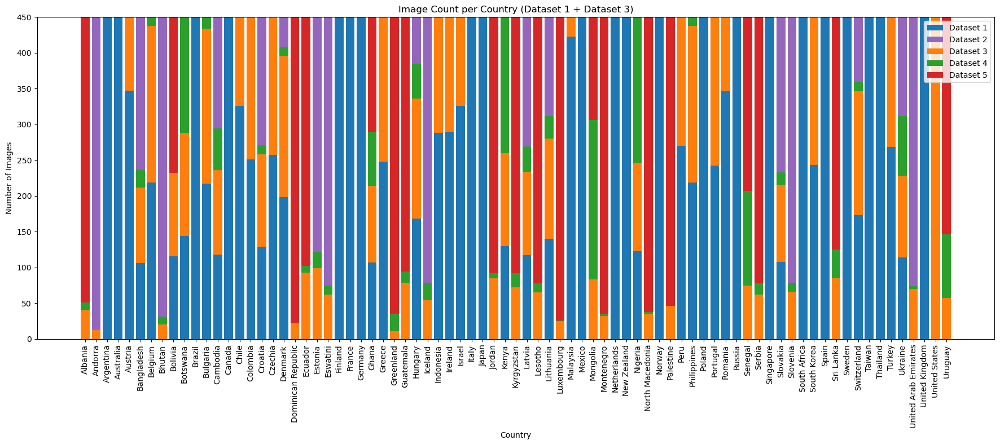

In [ ]:
# Plot
labels = COUNTRIES
ds1_vals = np.array([counts1.get(c, 0) for c in labels])
ds2_vals = np.array([counts2.get(c, 0) for c in labels]) * 3
ds3_vals = np.array([counts3.get(c, 0) for c in labels])
ds4_vals = np.array([counts4.get(c, 0) for c in labels])
ds5_vals = np.array([counts5.get(c, 0) for c in labels])

x = np.arange(len(labels))

plt.figure(figsize=(18, 8))
plt.bar(x, ds1_vals, label='Dataset 1', color='#1f77b4')
plt.bar(x, ds2_vals, bottom=ds1_vals + ds3_vals + ds4_vals + ds5_vals, label='Dataset 2', color='#9467bd')
plt.bar(x, ds3_vals, bottom=ds1_vals, label='Dataset 3', color='#ff7f0e')
plt.bar(x, ds4_vals, bottom=ds1_vals + ds3_vals, label='Dataset 4', color='#2ca02c')
plt.bar(x, ds5_vals, bottom=ds1_vals + ds3_vals + ds4_vals, label='Dataset 5', color='#d62728')

plt.xticks(x, labels, rotation=90)
plt.xlabel('Country')
plt.ylabel('Number of Images')
plt.title('Image Count per Country')
plt.legend()
plt.tight_layout()
plt.ylim(0, 450)
plt.show()

## Create medium dataset

In [38]:
def split_by_three(image_path: str) -> Tuple[Image.Image, Image.Image, Image.Image]:
    """
    Splits an image into three equal vertical chunks.

    Parameters:
    - image_path (str): Path to the input image.

    Returns:
    - Tuple[Image.Image, Image.Image, Image.Image]: Three PIL Image objects representing the chunks.
    """
    image = Image.open(image_path)
    width, height = image.size
    chunk_width = width // 3

    chunk1 = image.crop((0, 0, chunk_width, height))
    chunk2 = image.crop((chunk_width, 0, 2 * chunk_width, height))
    chunk3 = image.crop((2 * chunk_width, 0, width, height))

    return chunk1, chunk2, chunk3

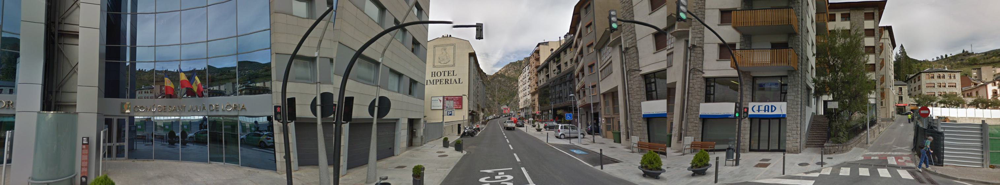

In [180]:
# show one random image in dataset 2
dataset2_path = dataset_paths["Dataset2"]
sample_path = dataset2_path / "Andorra" / "AD_00364.jpg"
sample_path.exists()
sample = Image.open(sample_path)
sample

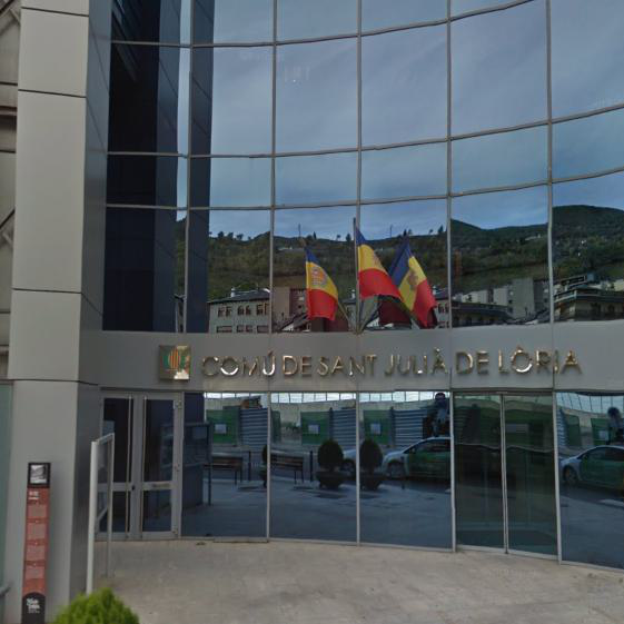

In [182]:
chunk1, chunk2, chunk3 = split_by_three(sample_path)
center_crop_to_square(chunk1, 624)

In [46]:
def gather_images_for_country(country: str, TARGET_COUNT):
    out = []
    def list_imgs(ds_path):
        folder = ds_path / country
        if not folder.is_dir(): return []
        return [p for p in folder.rglob("*")
                if p.suffix.lower() in (".jpg", ".jpeg", ".png")]

    # Change priority: (path, crop, from_ds2)
    sources = [
        (dataset1_path, True,  False),
        (dataset3_path, True,  False),
        (dataset5_path, False, False),
        (dataset2_path, True,  True),   # mark ds2
        (dataset4_path, False, False),
    ]

    print(f"\nCountry '{country}':")
    for i,(ds,_,f2) in enumerate(sources,1):
        print(f" Source{i}: {ds.name} = {len(list_imgs(ds))} imgs")

    # build list
    for ds_path, crop_flag, from_ds2 in sources:
        for p in list_imgs(ds_path):
            out.append((p, crop_flag, from_ds2))

    # dedupe + trim
    seen, final = set(), []
    for src, crop_flag, from_ds2 in out:
        if src in seen: continue
        seen.add(src)
        final.append((src, crop_flag, from_ds2))
        if len(final) >= TARGET_COUNT:
            break

    print(f" -> selected: {len(final)}")
    return final


In [52]:
for split in splits:
    for country in COUNTRIES:
        (medium_ds_root / split / country).mkdir(parents=True, exist_ok=True)

In [54]:
# ─── MAIN LOOP (corrected folder structure) ─────────────────────────────────
# Ensure top‐level split folders exist
for split in ("train", "dev", "test"):
    (medium_ds_root / split).mkdir(exist_ok=True)

# Process each country in turn, streaming picks into train/dev/test
for country in COUNTRIES:
    picks = gather_images_for_country(country, TARGET_COUNT=450)
    print(f"\nCountry '{country}': picked {len(picks)} sources")

    # Set up quotas
    quotas = {"train": 360, "dev": 45, "test": 45}

    pick_idx = 0
    # For each split, write exactly quota images into split/country
    for split, quota in quotas.items():
        out_dir = medium_ds_root / split / country
        out_dir.mkdir(parents=True, exist_ok=True)

        saved = 0
        while saved < quota and pick_idx < len(picks):
            src_path, do_crop, from_ds2 = picks[pick_idx]

            if from_ds2:
                for chunk in split_by_three(src_path):
                    if saved >= quota:
                        break
                    img = center_crop_to_square(chunk, 624)
                    fname = f"{saved+1:03d}.jpg"
                    img.save(out_dir / fname)
                    saved += 1
            else:
                img = Image.open(src_path).convert("RGB")
                if do_crop:
                    img = center_crop_to_square(img, 624)
                fname = f"{saved+1:03d}.jpg"
                img.save(out_dir / fname)
                saved += 1

            # advance to next pick only after emitting all chunks
            pick_idx += 1

        print(f"  {split}/{country}: saved {saved} images")

print("All done.")



Country 'Albania':
 Source1: dataset1 = 0 imgs
 Source2: dataset3 = 41 imgs
 Source3: additional_images = 503 imgs
 Source4: dataset2 = 0 imgs
 Source5: dataset4 = 10 imgs
 -> selected: 450

Country 'Albania': picked 450 sources
  train/Albania: saved 360 images
  dev/Albania: saved 45 images
  test/Albania: saved 45 images

Country 'Andorra':
 Source1: dataset1 = 0 imgs
 Source2: dataset3 = 13 imgs
 Source3: additional_images = 0 imgs
 Source4: dataset2 = 205 imgs
 Source5: dataset4 = 1 imgs
 -> selected: 219

Country 'Andorra': picked 219 sources
  train/Andorra: saved 360 images
  dev/Andorra: saved 45 images
  test/Andorra: saved 45 images

Country 'Argentina':
 Source1: dataset1 = 689 imgs
 Source2: dataset3 = 689 imgs
 Source3: additional_images = 0 imgs
 Source4: dataset2 = 210 imgs
 Source5: dataset4 = 905 imgs
 -> selected: 450

Country 'Argentina': picked 450 sources
  train/Argentina: saved 360 images
  dev/Argentina: saved 45 images
  test/Argentina: saved 45 images

Count

In [ ]:
# check how many folders are in small_ds_root
len([f for f in medium_ds_root.iterdir() if f.is_dir() and f.name in COUNTRIES])

79

## Upload to wasabi

In [58]:
os.environ["AWS_ACCESS_KEY_ID"] = "VIH97PD2FNFFMYQAESDR"
os.environ["AWS_SECRET_ACCESS_KEY"] = "X2UgOtGwJP5DFYnYjSloe9ilVVb89wseGiRKZa9T"

s3 = boto3.client(
  's3',
  endpoint_url='https://s3.eu-south-1.wasabisys.com',
  config=Config(signature_version='s3v4')
)
s3.list_buckets()  # should show your geoguesser-dataset bucket

{'ResponseMetadata': {'RequestId': '17EFF24BB2623257:A',
  'HostId': '742cHgc0/XnD7Bz1r9uvtQMhGWfW8dRz8CCY62M6IQ3W9pOV3UqacSIcbFXZtgy6ESScL2zbhgvO',
  'HTTPStatusCode': 200,
  'HTTPHeaders': {'content-type': 'application/xml',
   'date': 'Thu, 15 May 2025 12:27:30 GMT',
   'server': 'WasabiS3/7.22.1268-2025-01-15-40c9383ab3',
   'x-amz-id-2': '742cHgc0/XnD7Bz1r9uvtQMhGWfW8dRz8CCY62M6IQ3W9pOV3UqacSIcbFXZtgy6ESScL2zbhgvO',
   'x-amz-request-id': '17EFF24BB2623257:A',
   'x-wasabi-cm-reference-id': '1747312050527 154.56.213.102 ConID:300868961/EngineConID:5707722/Core:103',
   'transfer-encoding': 'chunked'},
  'RetryAttempts': 0},
 'Buckets': [{'Name': 'geoguesser-dataset',
   'CreationDate': datetime.datetime(2025, 5, 11, 12, 18, 16, tzinfo=tzutc())}],
 'Owner': {'DisplayName': 'nardimichelangelo',
  'ID': 'D330802473172BA28BCAD7E36CB48779075197390B33D9CC60721F6089B54D39'}}

In [59]:
# --- CONFIG ---
LOCAL_ROOT = '../medium_dataset'
BUCKET     = 'geoguesser-dataset'
ENDPOINT   = 'https://s3.eu-south-1.wasabisys.com'
# ---------------

# Initialize Wasabi S3 client
s3 = boto3.client('s3',
    endpoint_url=ENDPOINT,
    config=Config(signature_version='s3v4')
)

In [60]:
# Recursively upload every file under medium_dataset/, preserving train/dev/test and country subfolders
for root, dirs, files in os.walk(LOCAL_ROOT):
    for filename in files:
        local_path = os.path.join(root, filename)
        # Build the S3 key so it mirrors the local folder structure under medium_dataset/
        rel_path = os.path.relpath(local_path, LOCAL_ROOT).replace(os.sep, '/')
        s3_key   = f"medium_dataset/{rel_path}"

        print(f"Uploading {local_path} → s3://{BUCKET}/{s3_key}")
        s3.upload_file(local_path, BUCKET, s3_key)

print("✅ All files in medium_dataset/ (train/dev/test) have been uploaded to your bucket.")

Uploading ../medium_dataset/test/Bhutan/016.jpg → s3://geoguesser-dataset/medium_dataset/test/Bhutan/016.jpg
Uploading ../medium_dataset/test/Bhutan/002.jpg → s3://geoguesser-dataset/medium_dataset/test/Bhutan/002.jpg
Uploading ../medium_dataset/test/Bhutan/003.jpg → s3://geoguesser-dataset/medium_dataset/test/Bhutan/003.jpg
Uploading ../medium_dataset/test/Bhutan/017.jpg → s3://geoguesser-dataset/medium_dataset/test/Bhutan/017.jpg
Uploading ../medium_dataset/test/Bhutan/029.jpg → s3://geoguesser-dataset/medium_dataset/test/Bhutan/029.jpg
Uploading ../medium_dataset/test/Bhutan/001.jpg → s3://geoguesser-dataset/medium_dataset/test/Bhutan/001.jpg
Uploading ../medium_dataset/test/Bhutan/015.jpg → s3://geoguesser-dataset/medium_dataset/test/Bhutan/015.jpg
Uploading ../medium_dataset/test/Bhutan/014.jpg → s3://geoguesser-dataset/medium_dataset/test/Bhutan/014.jpg
Uploading ../medium_dataset/test/Bhutan/028.jpg → s3://geoguesser-dataset/medium_dataset/test/Bhutan/028.jpg
Uploading ../medium

## Create extra and upload to wasabi

In [74]:
project_root     = Path().resolve().parent
extra_data_root  = project_root / "data" / "extra_data"
TARGET_COUNTRIES = ["United States", "United Kingdom", "New Zealand"]
TARGET_COUNT     = 5000
CROP_SIZE        = 624   # for center_crop_to_square
# ────────────────────────────────────────────────────────────────────────────

# Ensure output root exists
extra_data_root.mkdir(parents=True, exist_ok=True)

for country in TARGET_COUNTRIES:
    print(f"\nProcessing country: {country}")

    # 1) Gather up to TARGET_COUNT picks (src_path, do_crop, from_ds2)
    picks = gather_images_for_country(country, TARGET_COUNT)
    if not picks:
        print(f"⚠️ No picks for {country}, skipping.")
        continue

    # Limit to exactly TARGET_COUNT
    picks = picks[:TARGET_COUNT]
    print(f"  → gathered {len(picks)} sources")

    # 2) Prepare output folder for this country
    out_dir = extra_data_root / country
    out_dir.mkdir(parents=True, exist_ok=True)

    # 3) Save each pick according to its flags
    idx = 0
    for src_path, do_crop, from_ds2 in picks:
        if from_ds2:
            # Dataset2 items produce three chunks each
            for chunk in split_by_three(src_path):
                if idx >= TARGET_COUNT:
                    break
                img = center_crop_to_square(chunk, CROP_SIZE)
                fname = f"{idx+1:04d}.jpg"
                img.save(out_dir / fname)
                idx += 1
        else:
            # Regular image
            img = Image.open(src_path).convert("RGB")
            if do_crop:
                img = center_crop_to_square(img, CROP_SIZE)
            fname = f"{idx+1:04d}.jpg"
            img.save(out_dir / fname)
            idx += 1

        if idx >= TARGET_COUNT:
            break

    print(f"  ✔ Saved {idx} images to {out_dir}")

print("\n✅ All done. Check `data/extra_data/` for your country folders.")


Processing country: United States

Country 'United States':
 Source1: dataset1 = 0 imgs
 Source2: dataset3 = 12014 imgs
 Source3: additional_images = 0 imgs
 Source4: dataset2 = 218 imgs
 Source5: dataset4 = 8 imgs
 -> selected: 5000
  → gathered 5000 sources
  ✔ Saved 5000 images to /Users/michelangelonardi/Desktop/Università/Master/Bocconi Master/Year 1/Semester2/Computer Vision & Image processing/Final - project/rainbot/data/extra_data/United States

Processing country: United Kingdom

Country 'United Kingdom':
 Source1: dataset1 = 2484 imgs
 Source2: dataset3 = 2484 imgs
 Source3: additional_images = 0 imgs
 Source4: dataset2 = 169 imgs
 Source5: dataset4 = 44 imgs
 -> selected: 5000
  → gathered 5000 sources
  ✔ Saved 5000 images to /Users/michelangelonardi/Desktop/Università/Master/Bocconi Master/Year 1/Semester2/Computer Vision & Image processing/Final - project/rainbot/data/extra_data/United Kingdom

Processing country: New Zealand

Country 'New Zealand':
 Source1: dataset1 

In [76]:
# ─── 2) Define local and remote roots ───────────────────────────
# Local folder containing the three country subfolders
LOCAL_ROOT = os.path.normpath(os.path.join("..", "data", "extra_data"))
# Remote prefix under which to place the folder
REMOTE_PREFIX = 'extra_data/'

# ─── 3) Recursively upload all images ────────────────────────────
for root, dirs, files in os.walk(LOCAL_ROOT):
    for filename in files:
        if not filename.lower().endswith(('.jpg', '.jpeg', '.png')):
            continue

        # Local full path, e.g. "../data/extra_data/United States/0001.jpg"
        local_path = os.path.join(root, filename)
        # Compute key relative to LOCAL_ROOT, preserving subfolders
        rel_path = os.path.relpath(local_path, LOCAL_ROOT).replace(os.sep, '/')
        # Final S3 key: "extra_data/United States/0001.jpg"
        s3_key = REMOTE_PREFIX + rel_path

        print(f"Uploading {local_path} → s3://{BUCKET}/{s3_key}")
        s3.upload_file(local_path, BUCKET, s3_key)

print("✅ All files under extra_data/ uploaded to Wasabi.")

Uploading ../data/extra_data/United Kingdom/0071.jpg → s3://geoguesser-dataset/extra_data/United Kingdom/0071.jpg
Uploading ../data/extra_data/United Kingdom/4217.jpg → s3://geoguesser-dataset/extra_data/United Kingdom/4217.jpg
Uploading ../data/extra_data/United Kingdom/3578.jpg → s3://geoguesser-dataset/extra_data/United Kingdom/3578.jpg
Uploading ../data/extra_data/United Kingdom/2666.jpg → s3://geoguesser-dataset/extra_data/United Kingdom/2666.jpg
Uploading ../data/extra_data/United Kingdom/2100.jpg → s3://geoguesser-dataset/extra_data/United Kingdom/2100.jpg
Uploading ../data/extra_data/United Kingdom/4571.jpg → s3://geoguesser-dataset/extra_data/United Kingdom/4571.jpg
Uploading ../data/extra_data/United Kingdom/0717.jpg → s3://geoguesser-dataset/extra_data/United Kingdom/0717.jpg
Uploading ../data/extra_data/United Kingdom/1409.jpg → s3://geoguesser-dataset/extra_data/United Kingdom/1409.jpg
Uploading ../data/extra_data/United Kingdom/0703.jpg → s3://geoguesser-dataset/extra_dat